# Data Analyst Take-Home Test: Payment Industry Case Study 

This notebook provides an analysis of payment transaction data, merchant details, and chargeback records using **DuckDB** for SQL-based querying.

## **Objectives:**
- **Understand trends in transaction volume and revenue**.
- **Identify top-performing merchants**.
- **Detect potential fraudulent activities**.
- **Assess the impact of failed transactions on revenue**.
- **Recommend strategies to improve transaction success rates**.

## **Dataset Information:**
- **transactions.xlsx**: Contains transaction records.
- **merchants.xlsx**: Contains merchant details.
- **chargebacks.xlsx**: Contains chargeback data (disputed transactions).

In [4]:
import pandas as pd
import duckdb
import matplotlib.pyplot as plt
import seaborn as sns
import sweetviz as sv
from ydata_profiling import ProfileReport

ModuleNotFoundError: No module named 'ydata_profiling'

In [2]:
# Set visualization style
sns.set_style("whitegrid")
%matplotlib notebook

# load all dataset into pandas, and ido necessary Explratory Data Analysis

In [3]:
# Load the datasets and Read data into Pandas DataFrames
transactions = pd.read_excel('transactions.xlsx')
merchants = pd.read_excel('merchants.xlsx')
chargebacks = pd.read_excel('chargebacks.xlsx')

In [4]:
#check sample transaction data
transactions.head()

,transaction_id,merchant_id,transaction_date,transaction_amount,currency,payment_method,status,failure_reason,country,customer_id
0,TXN000001,M0079,2024-01-01 00:00:00,638.54,GBP,credit_card,successful,NaN,Nigeria,C00493
1,TXN000002,M0052,2024-01-01 01:00:00,404.26,USD,crypto,chargeback,NaN,Kenya,C00648
2,TXN000003,M0039,2024-01-01 02:00:00,27.81,EUR,credit_card,successful,NaN,Canada,C00711
3,TXN000004,M0097,2024-01-01 03:00:00,956.75,NGN,mobile_money,successful,NaN,UK,C00057
4,TXN000005,M0056,2024-01-01 04:00:00,459.85,GBP,crypto,successful,NaN,UK,C00735


In [5]:
#check sample merchants data
merchants.head()

,merchant_id,merchant_name,merchant_category,country
0,M0001,Merchant_1,gaming,Kenya
1,M0002,Merchant_2,education,UK
2,M0003,Merchant_3,SaaS,Kenya
3,M0004,Merchant_4,travel,Nigeria
4,M0005,Merchant_5,travel,UK


In [6]:
#check sample chargebacks data
chargebacks.head()

,chargeback_id,transaction_id,merchant_id,chargeback_date,chargeback_amount,reason
0,CB00001,TXN000002,M0052,2024-02-01,404.26,fraud
1,CB00002,TXN000009,M0094,2024-02-02,819.55,fraud
2,CB00003,TXN000012,M0007,2024-02-03,366.68,product not received
3,CB00004,TXN000032,M0043,2024-02-04,399.92,duplicate transaction
4,CB00005,TXN000066,M0020,2024-02-05,77.49,product not received


### Exploratory Data Analysis for `transactions`

In [7]:
profile_transactions = ProfileReport(transactions, explorative=True)
profile_merchants = ProfileReport(merchants, explorative=True)
profile_chargebacks = ProfileReport(chargebacks, explorative=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


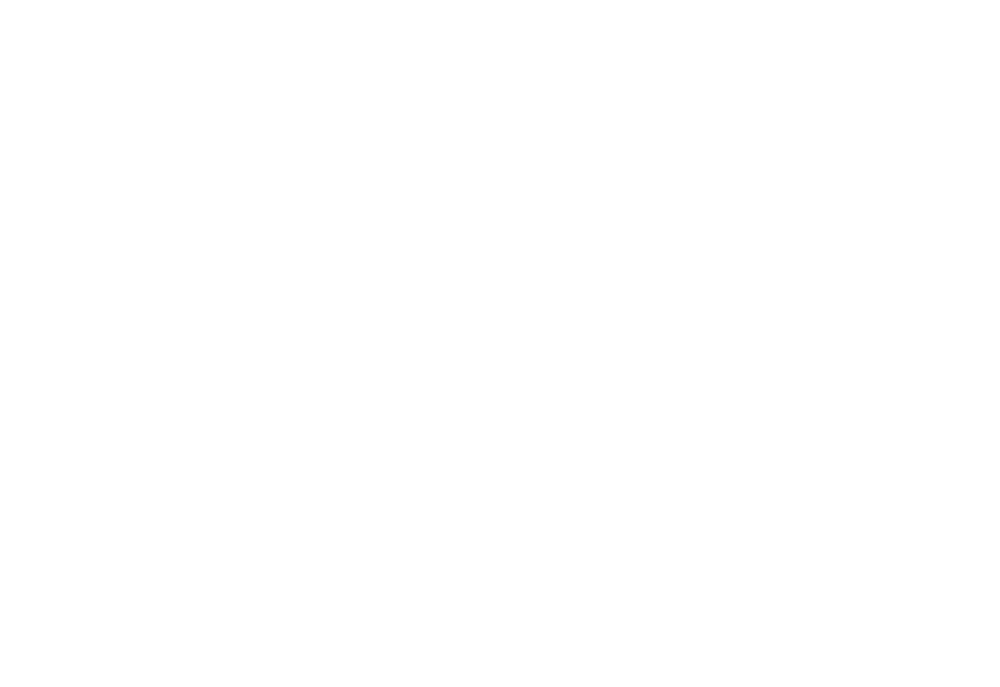

<IPython.core.display.Javascript object>


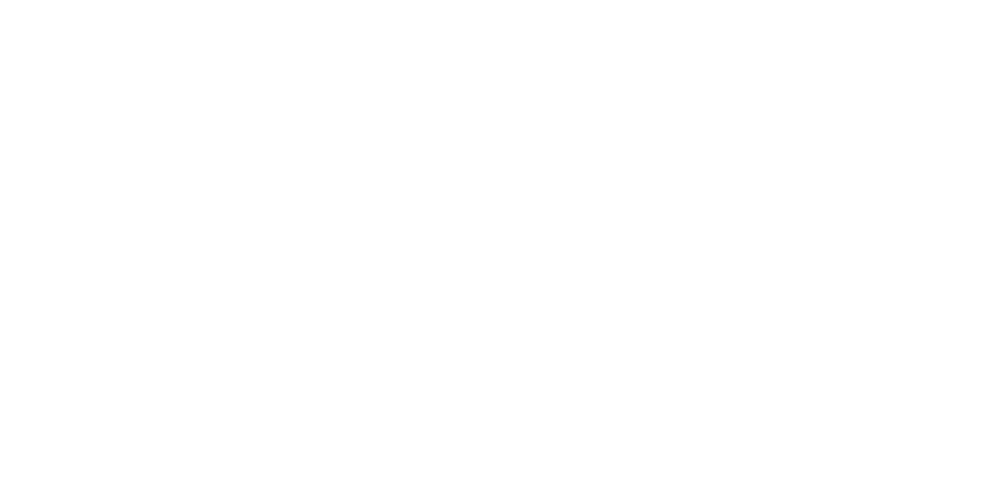

<IPython.core.display.Javascript object>


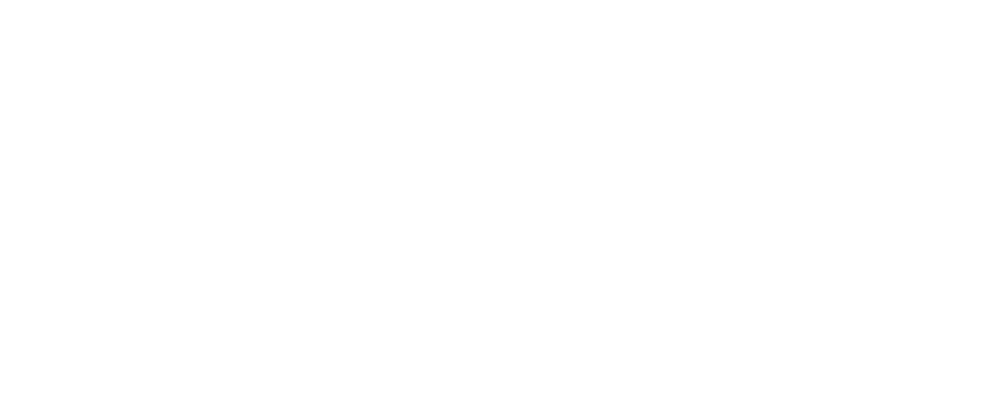

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


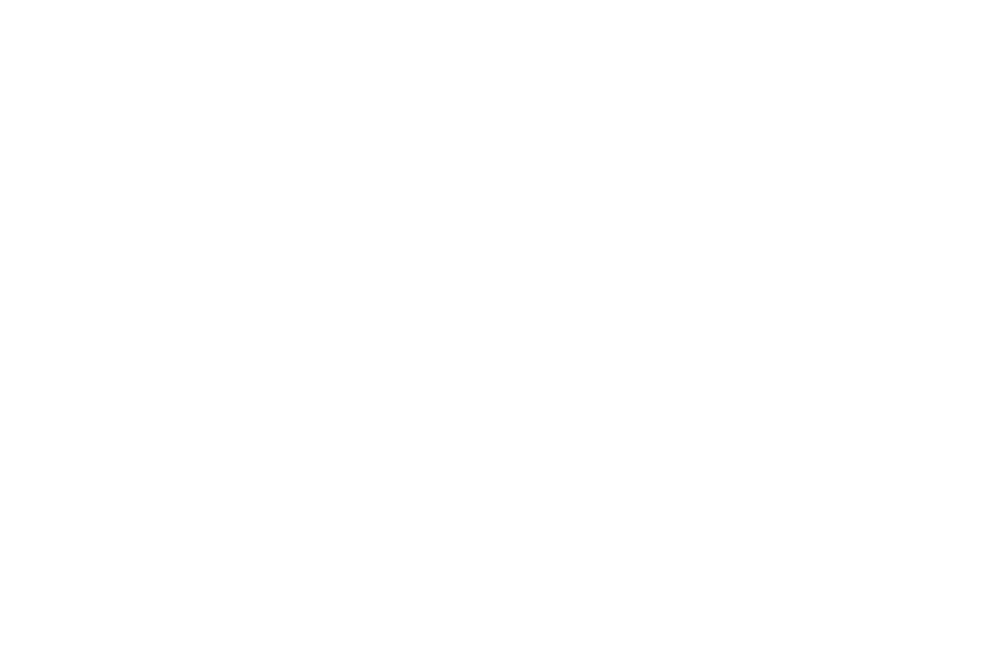

<IPython.core.display.Javascript object>


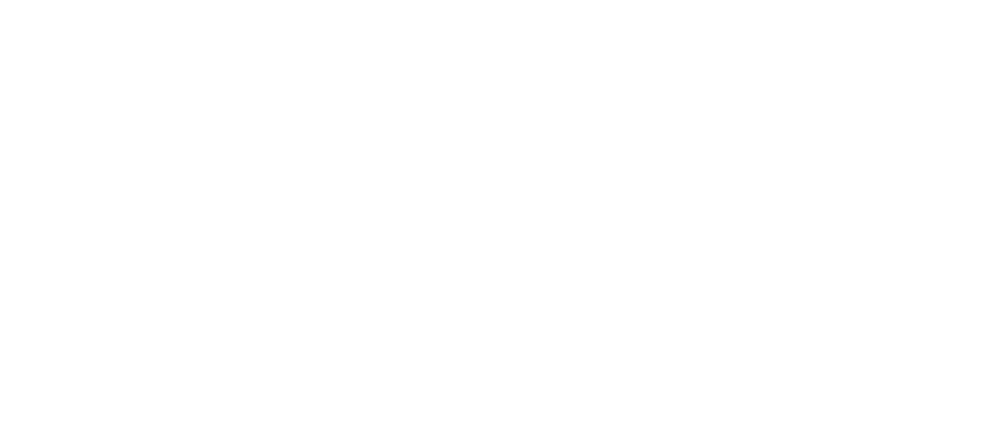

<IPython.core.display.Javascript object>


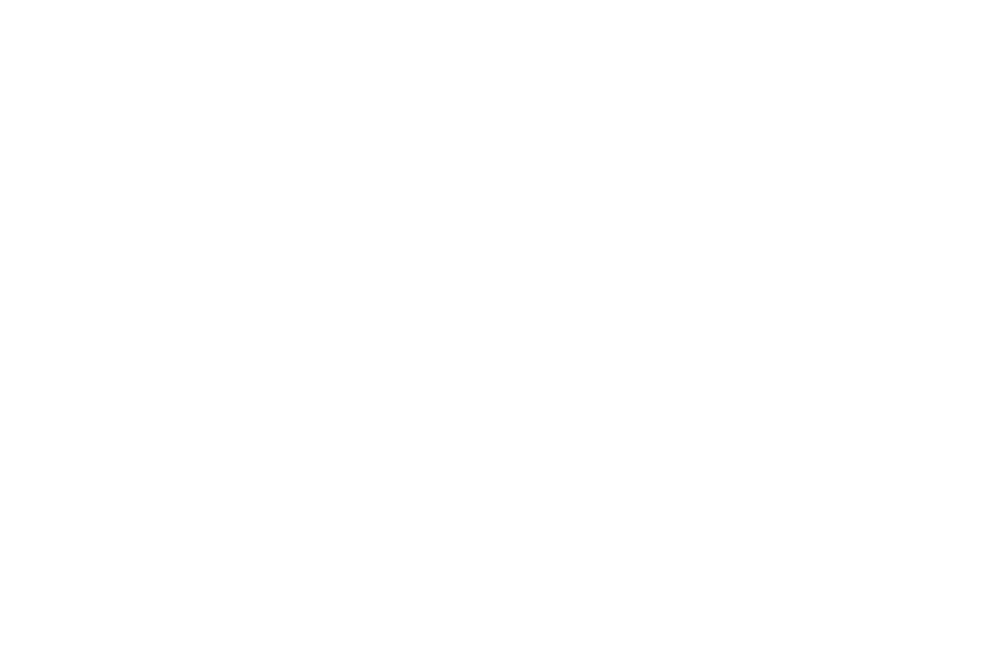

<IPython.core.display.Javascript object>


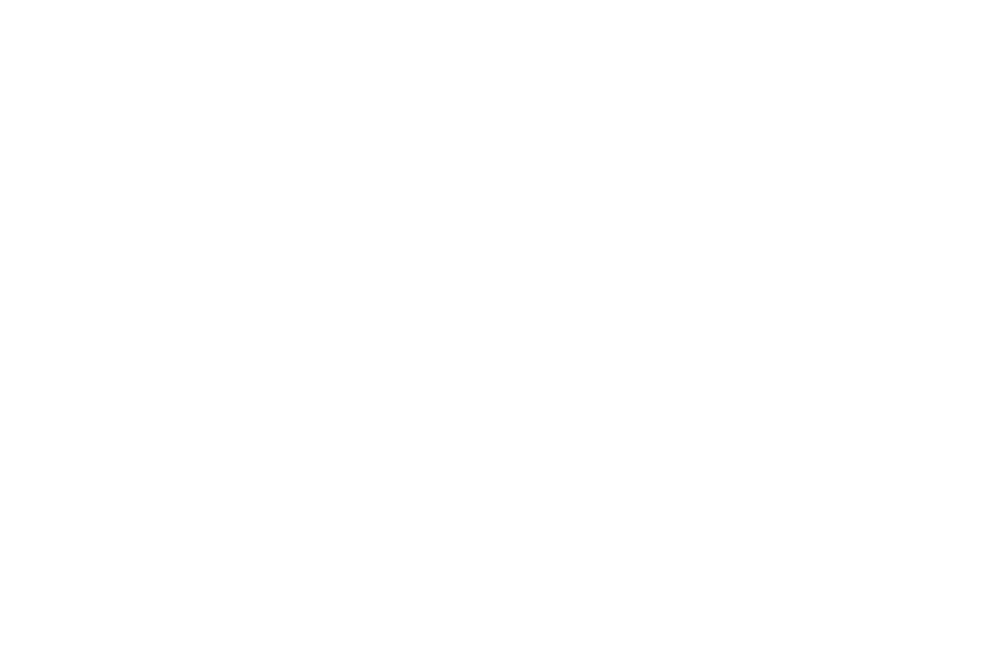

<IPython.core.display.Javascript object>


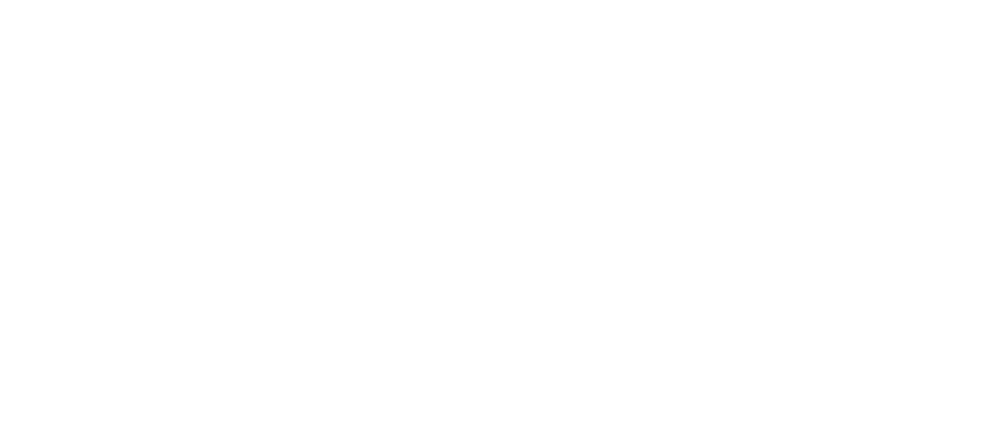

<IPython.core.display.Javascript object>


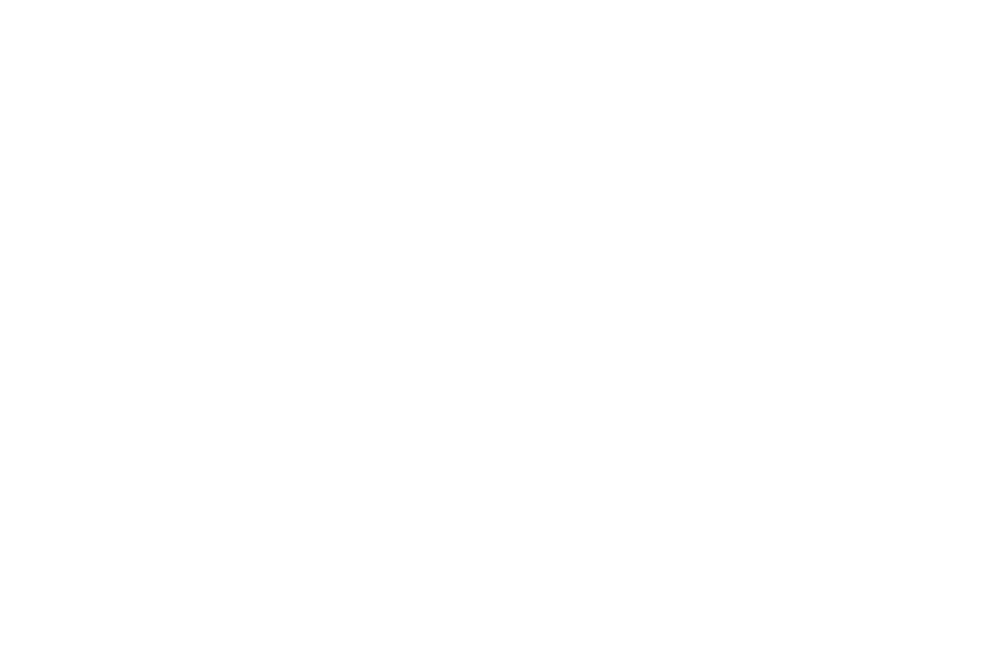

<IPython.core.display.Javascript object>


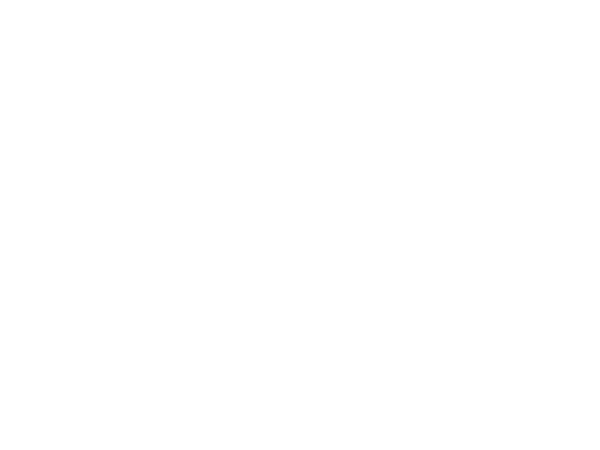

<IPython.core.display.Javascript object>


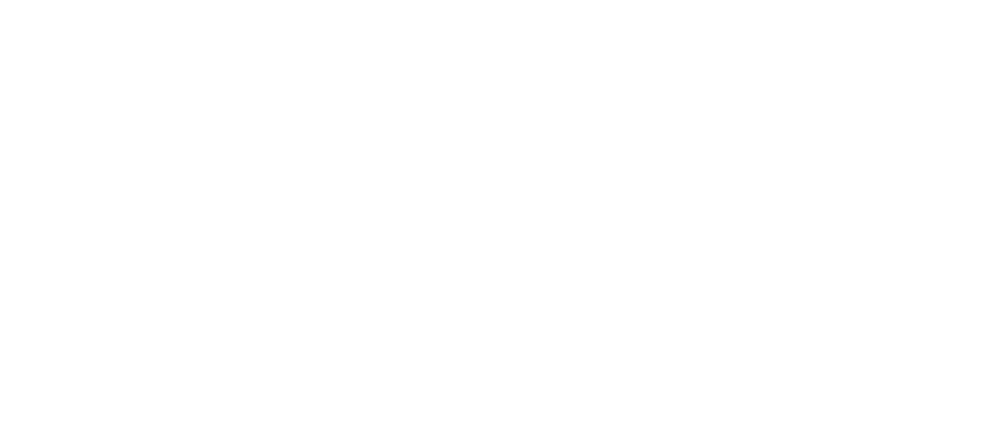

<IPython.core.display.Javascript object>


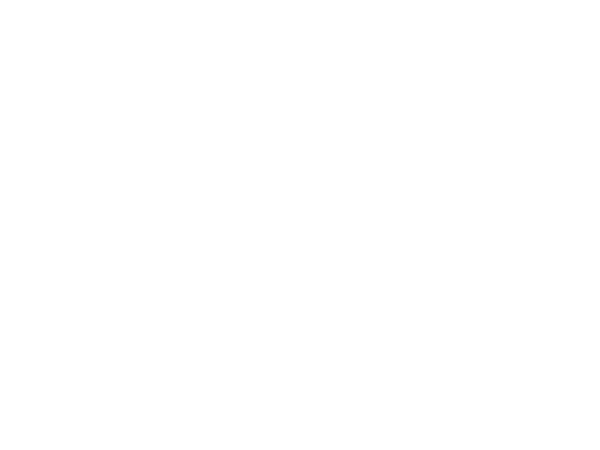

<IPython.core.display.Javascript object>


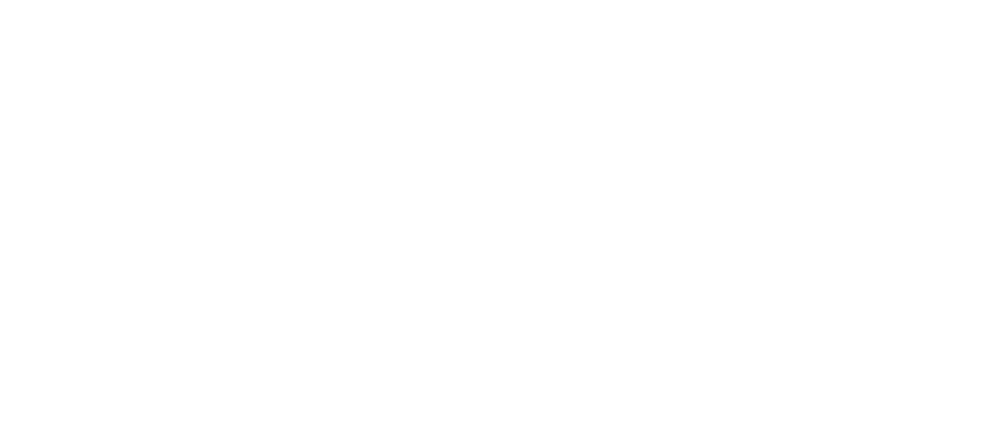

<IPython.core.display.Javascript object>


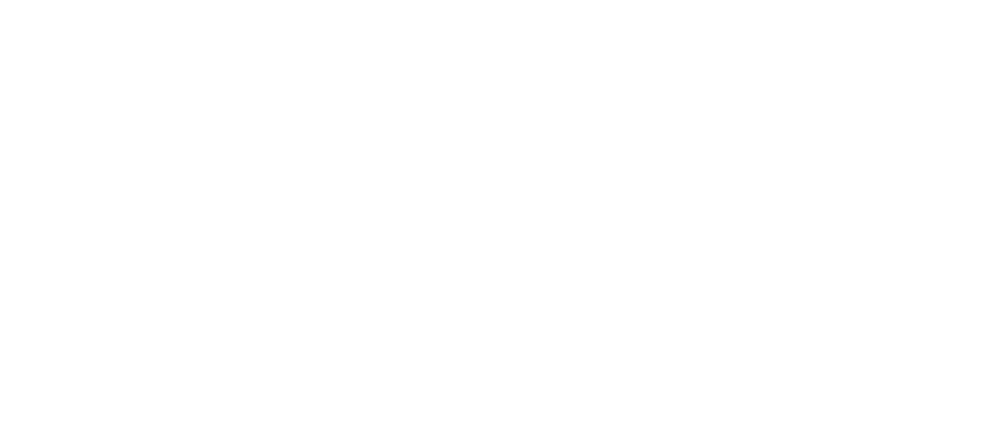

<IPython.core.display.Javascript object>


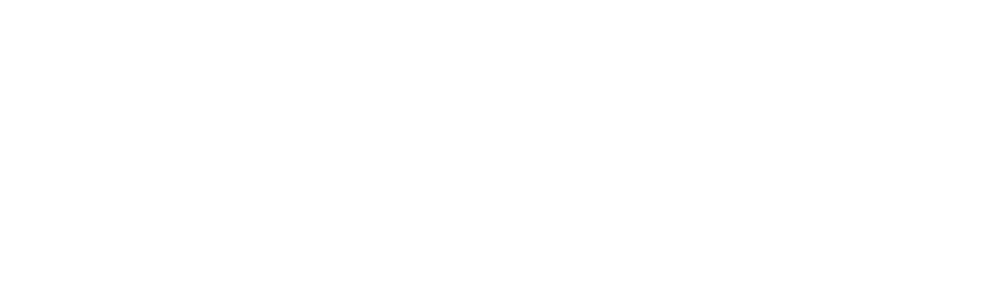

<IPython.core.display.Javascript object>


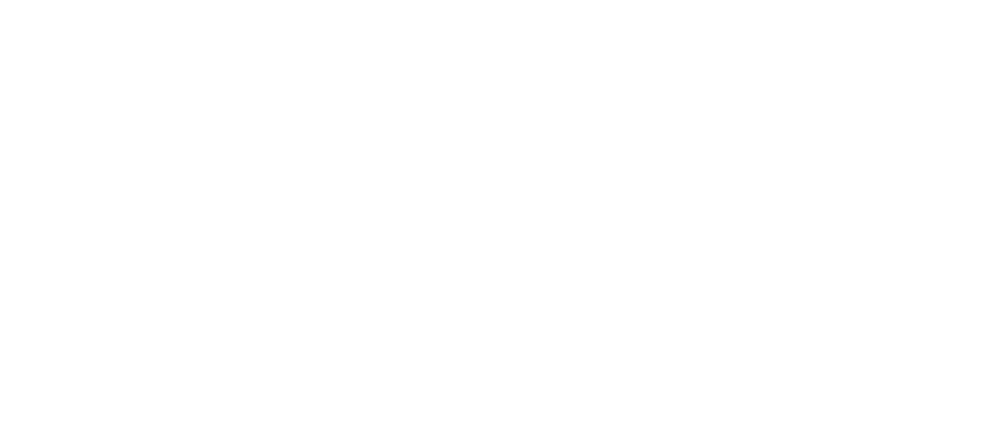

<IPython.core.display.Javascript object>


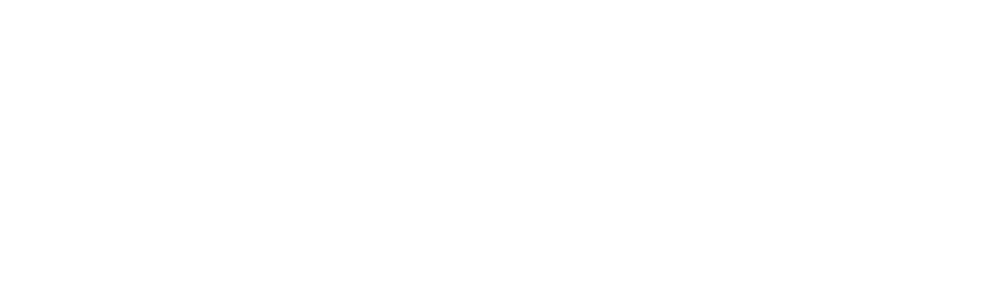

<IPython.core.display.Javascript object>


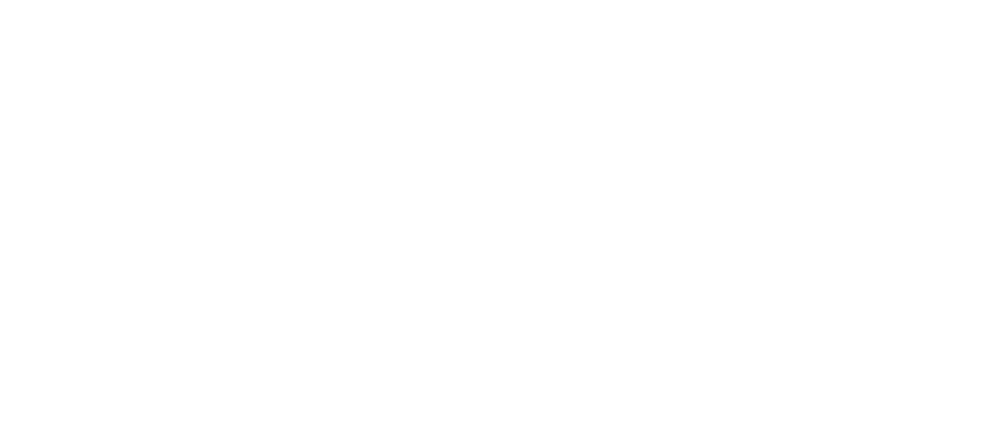

<IPython.core.display.Javascript object>


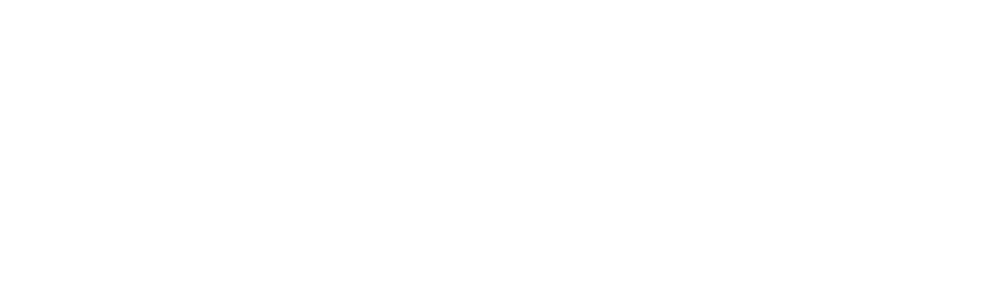

<IPython.core.display.Javascript object>


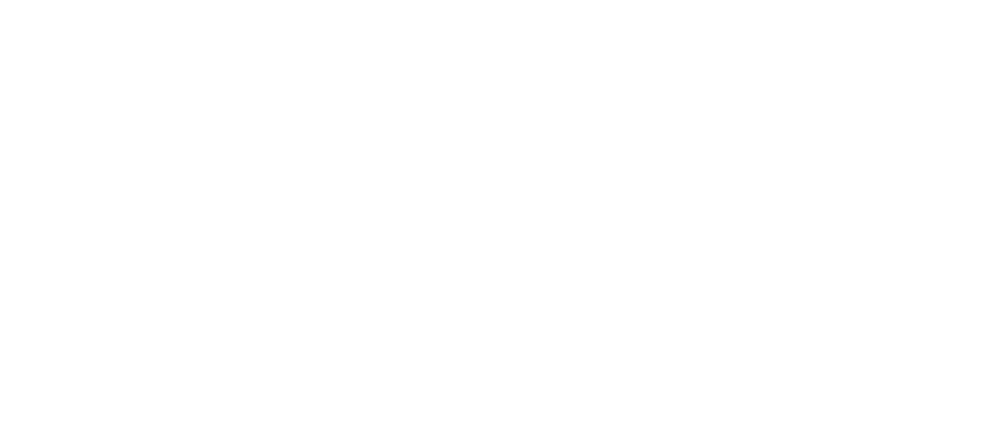

<IPython.core.display.Javascript object>


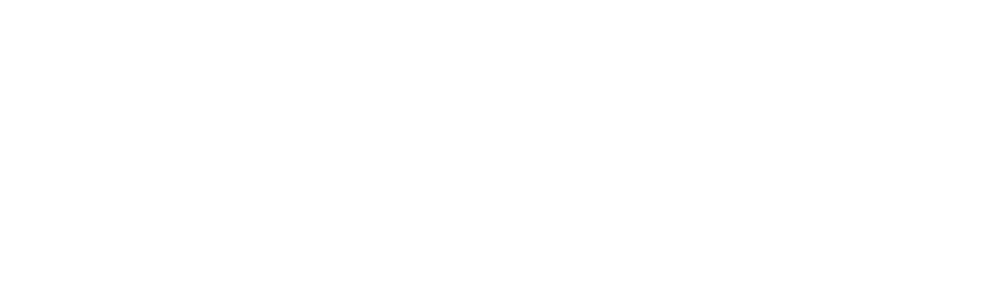

<IPython.core.display.Javascript object>


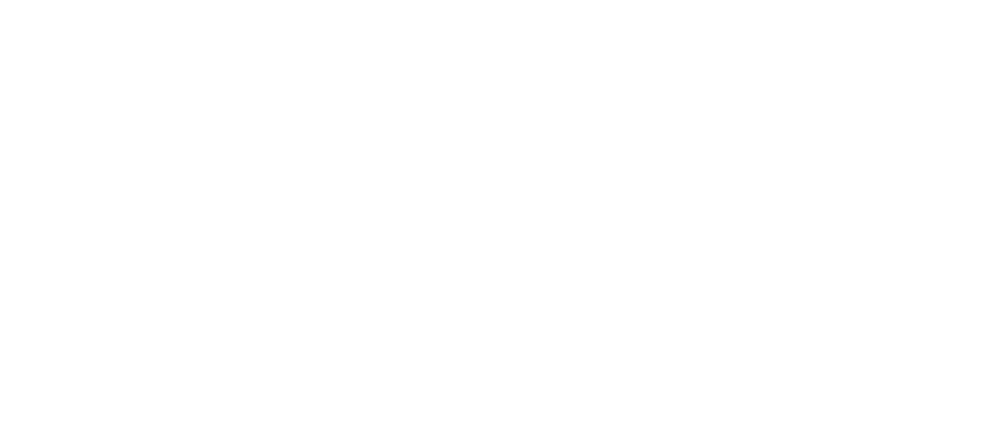

<IPython.core.display.Javascript object>


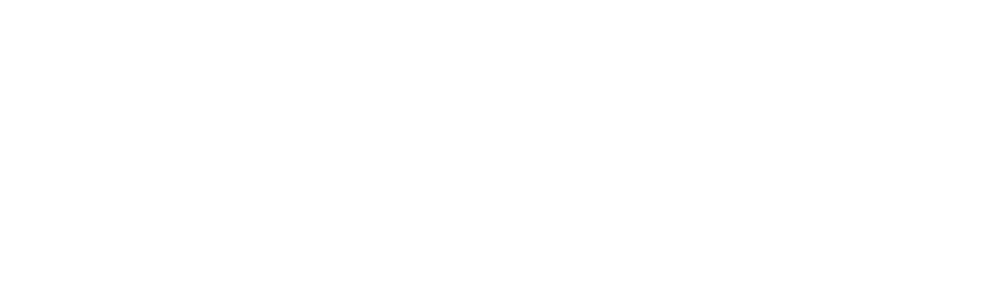

<IPython.core.display.Javascript object>


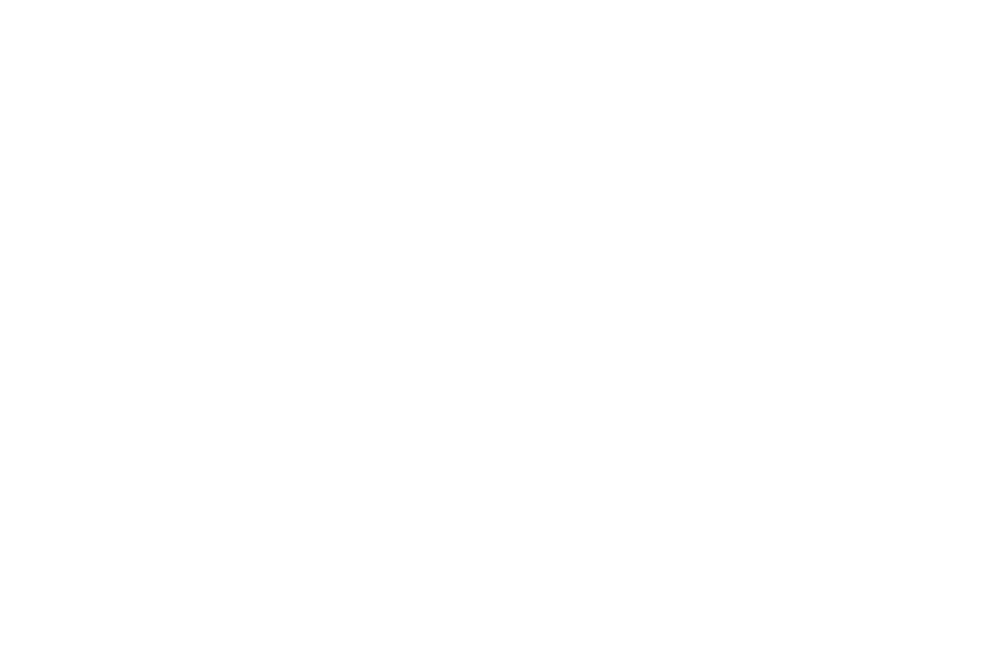

<IPython.core.display.Javascript object>


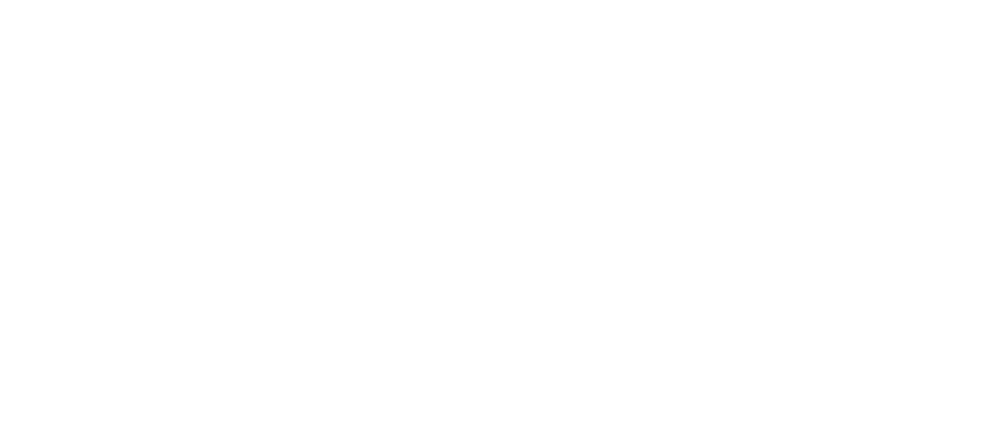

<IPython.core.display.Javascript object>


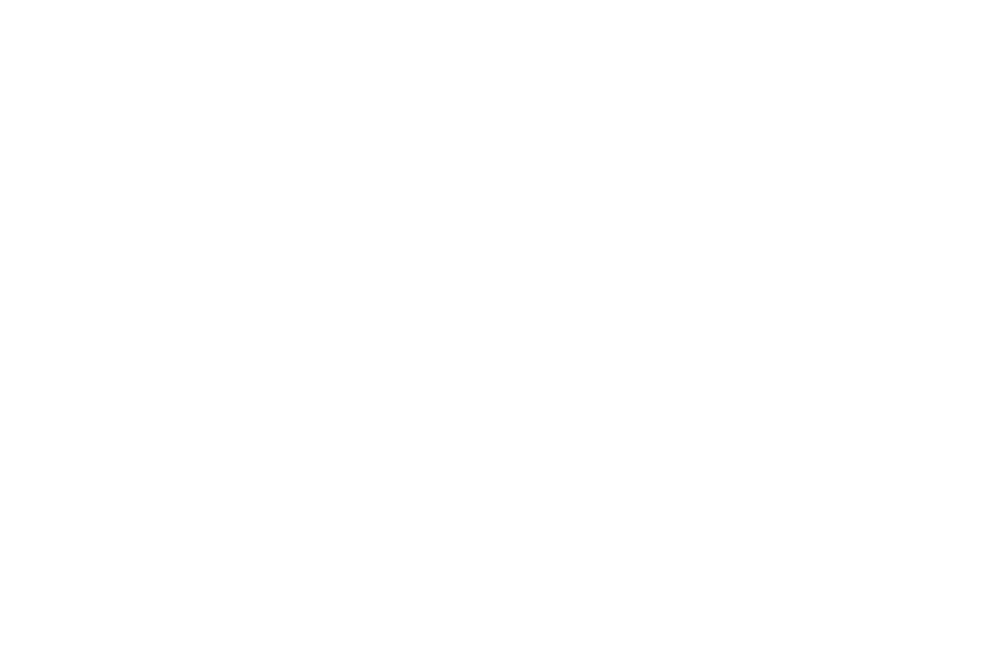

<IPython.core.display.Javascript object>


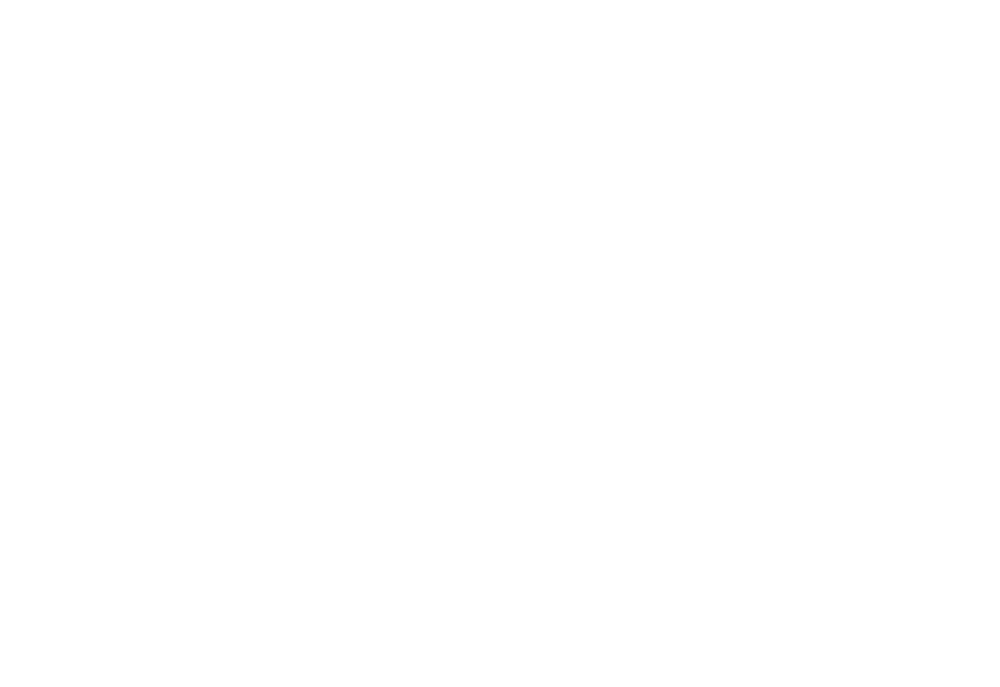

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
profile_transactions

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


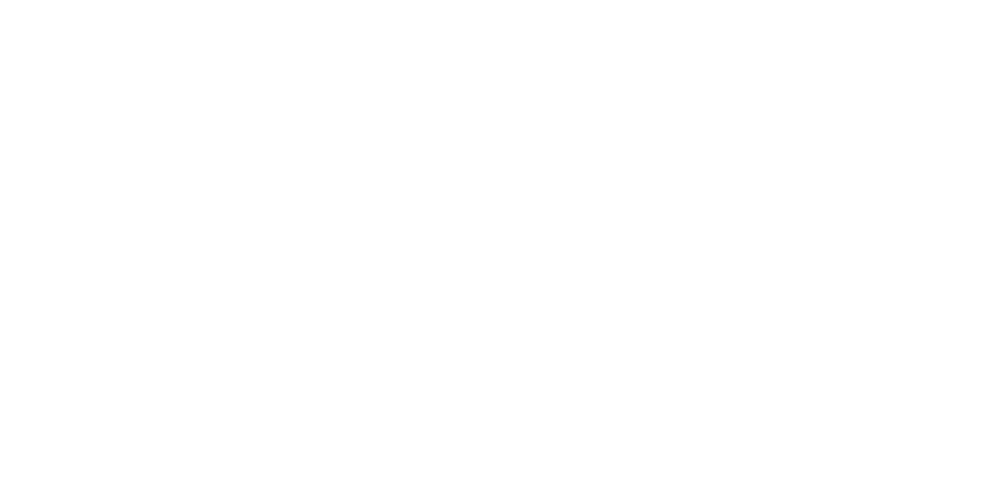

<IPython.core.display.Javascript object>


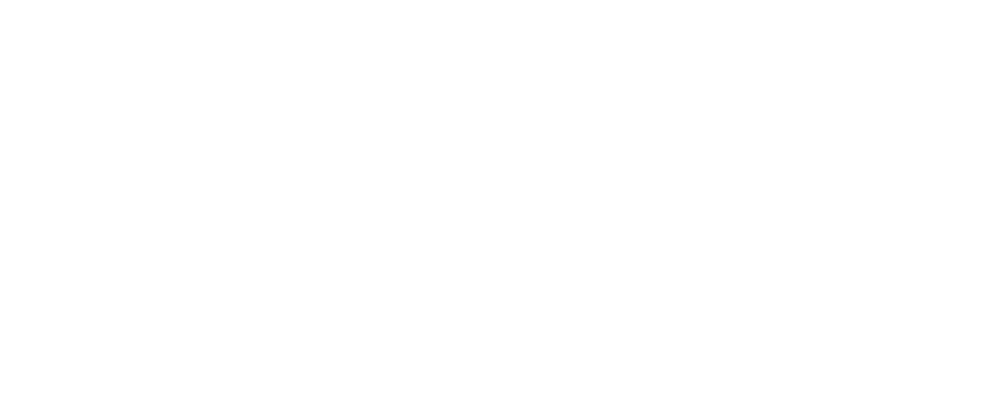

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


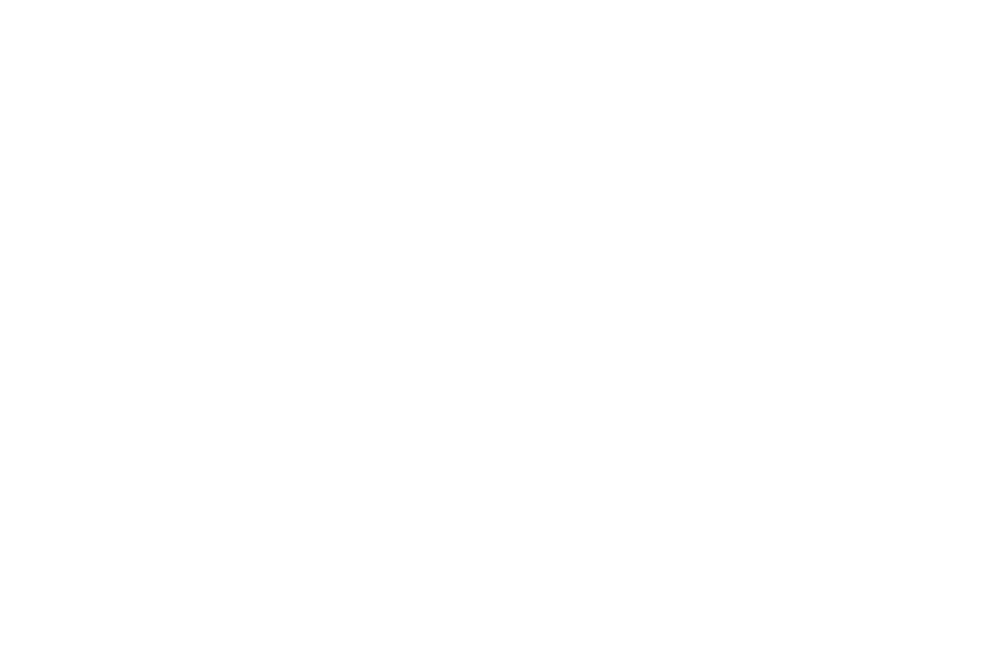

<IPython.core.display.Javascript object>


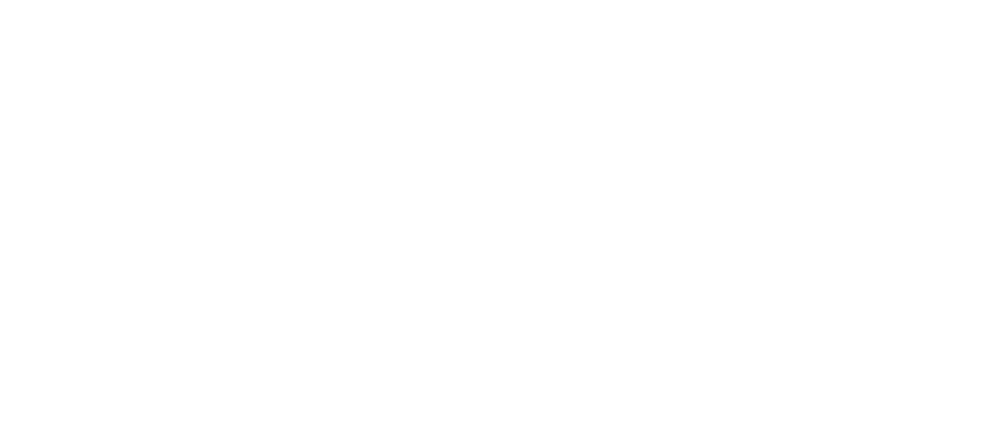

<IPython.core.display.Javascript object>


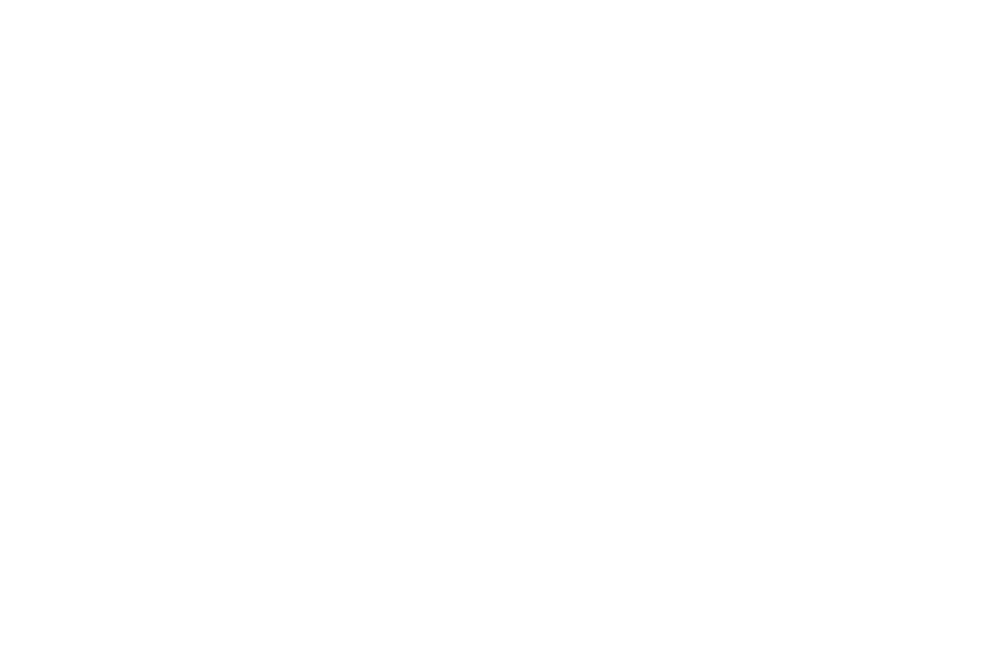

<IPython.core.display.Javascript object>


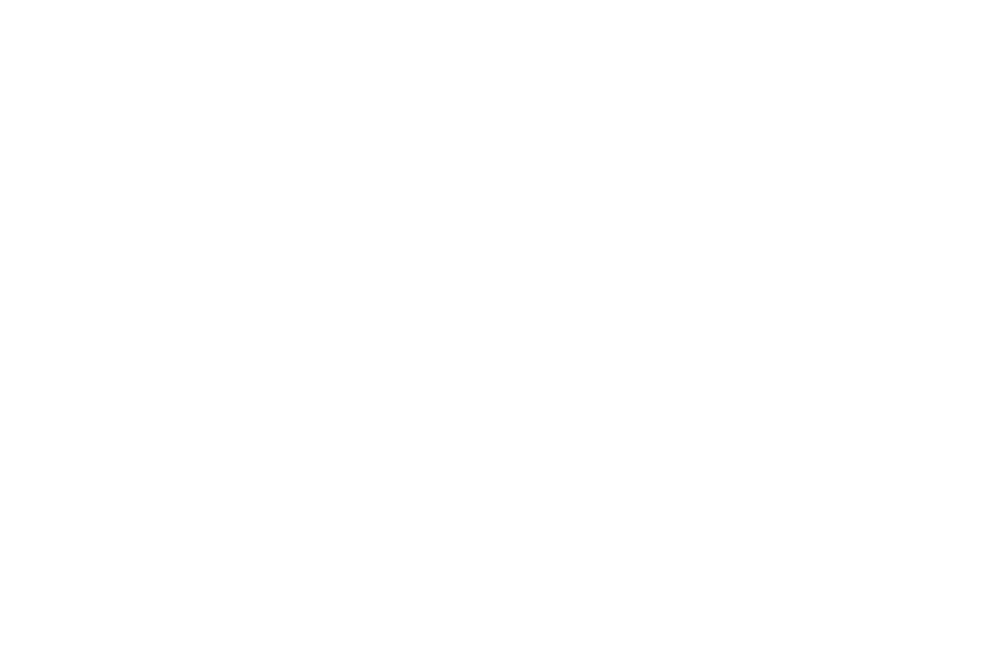

<IPython.core.display.Javascript object>


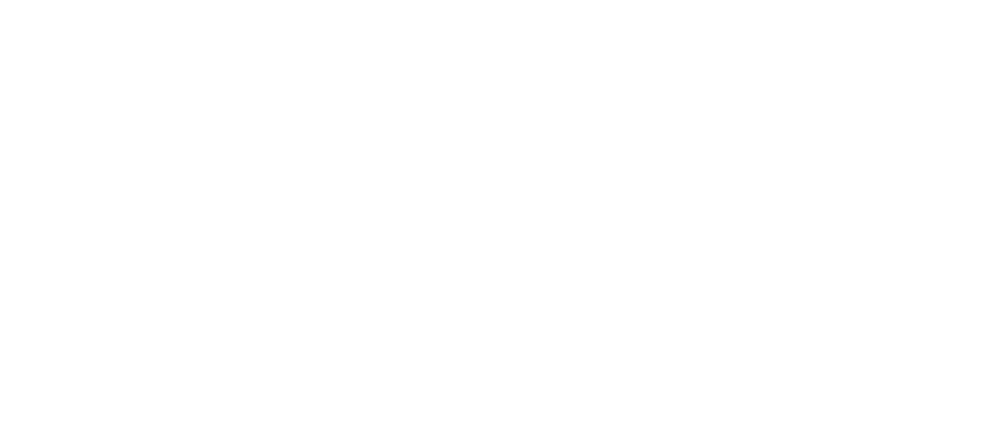

<IPython.core.display.Javascript object>


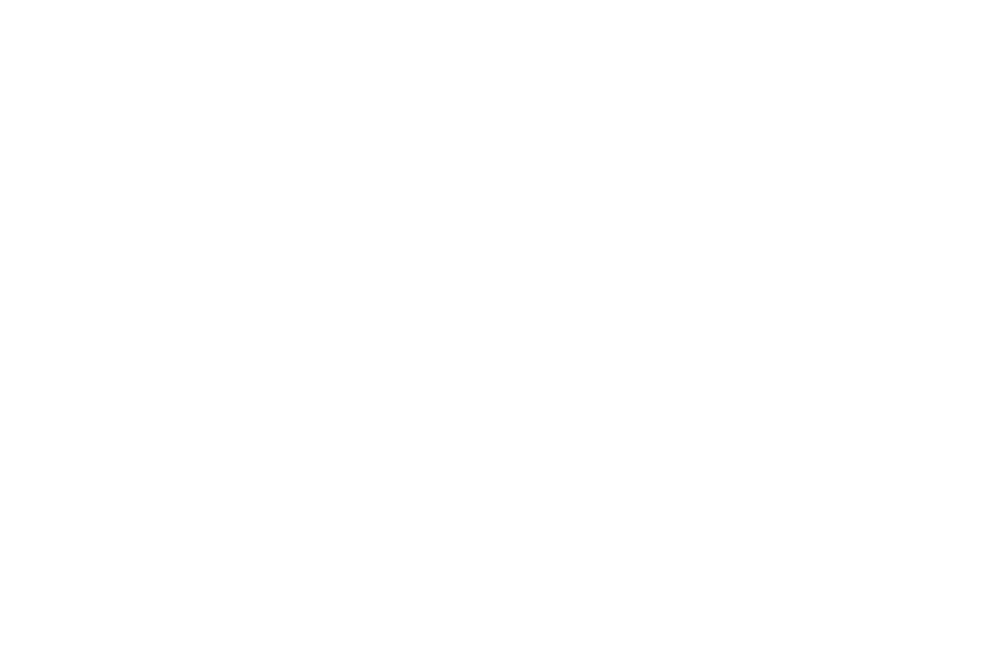

<IPython.core.display.Javascript object>


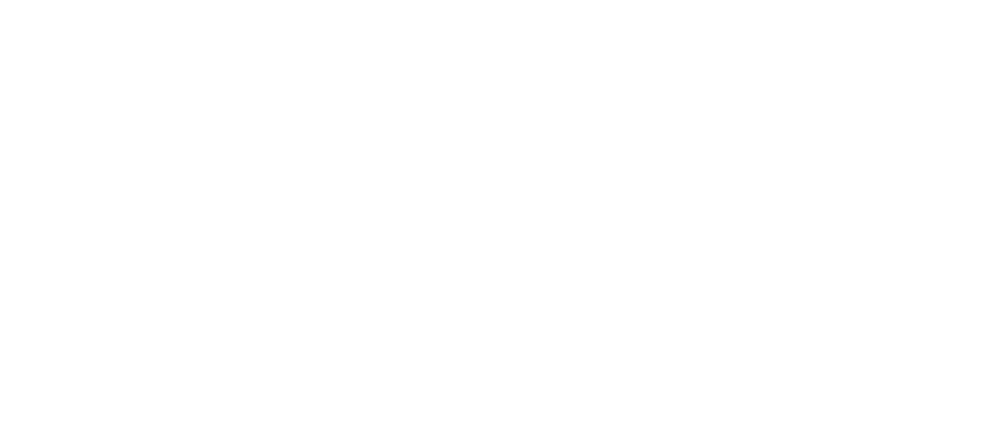

<IPython.core.display.Javascript object>


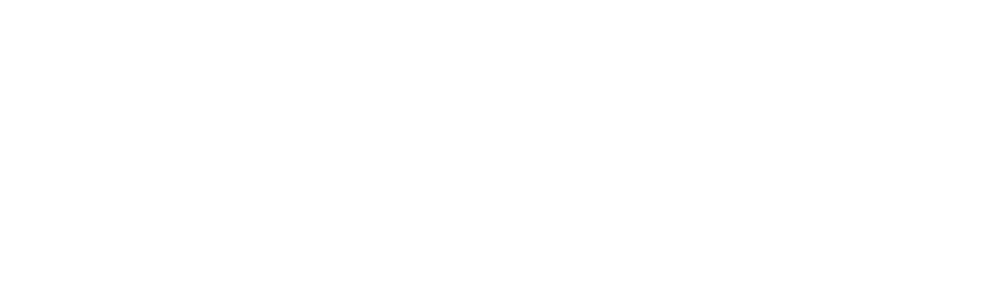

<IPython.core.display.Javascript object>


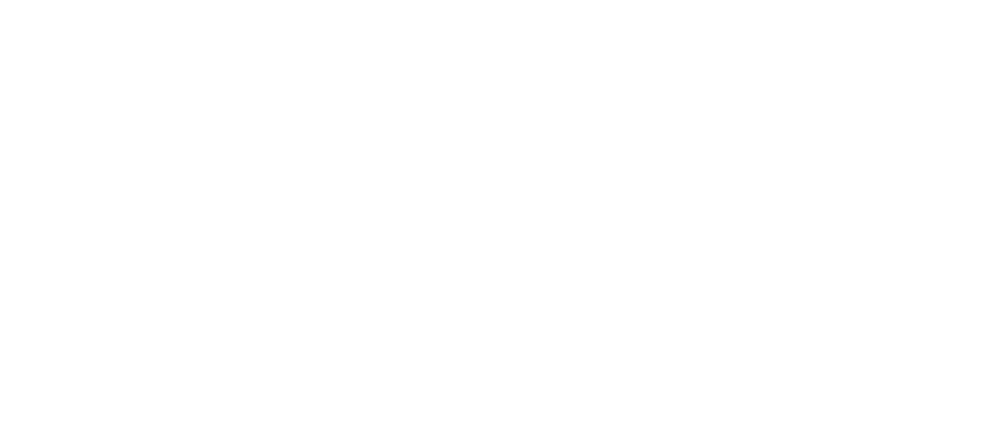

<IPython.core.display.Javascript object>


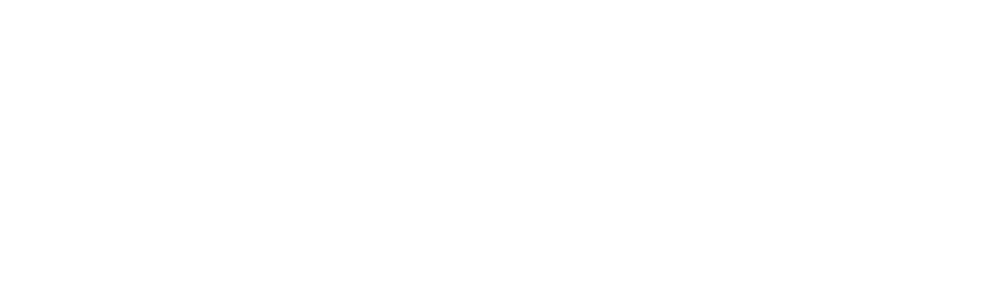

<IPython.core.display.Javascript object>


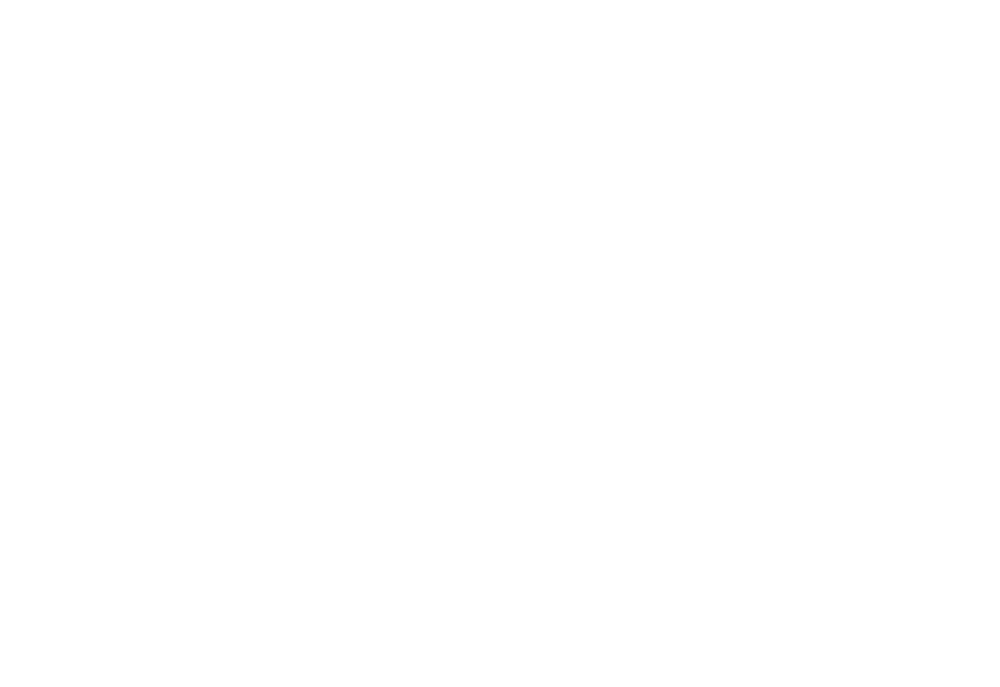

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
profile_merchants

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


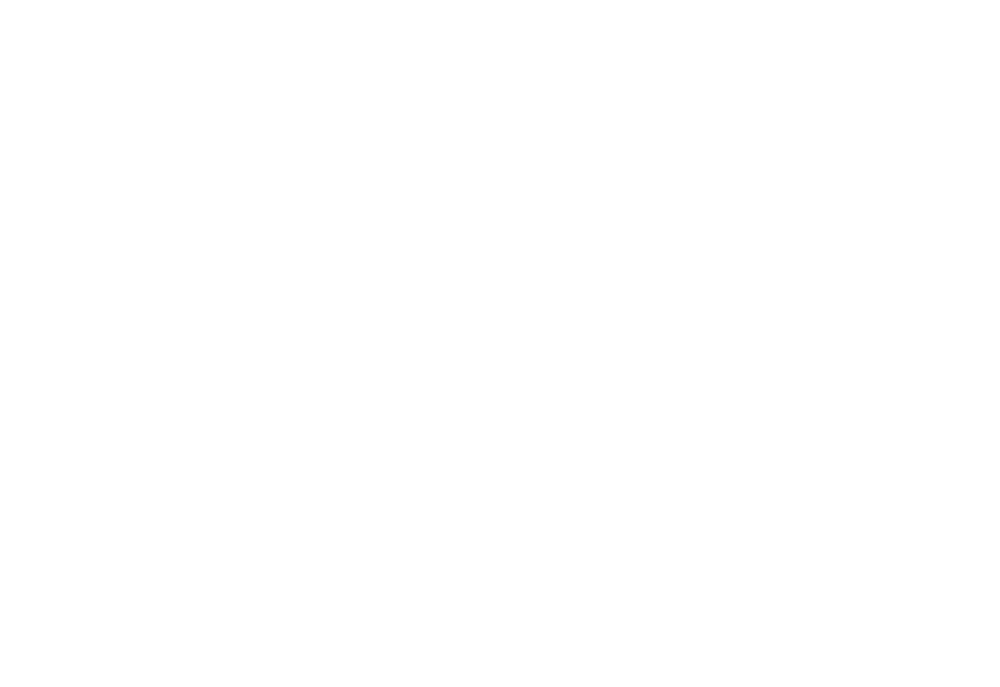

<IPython.core.display.Javascript object>


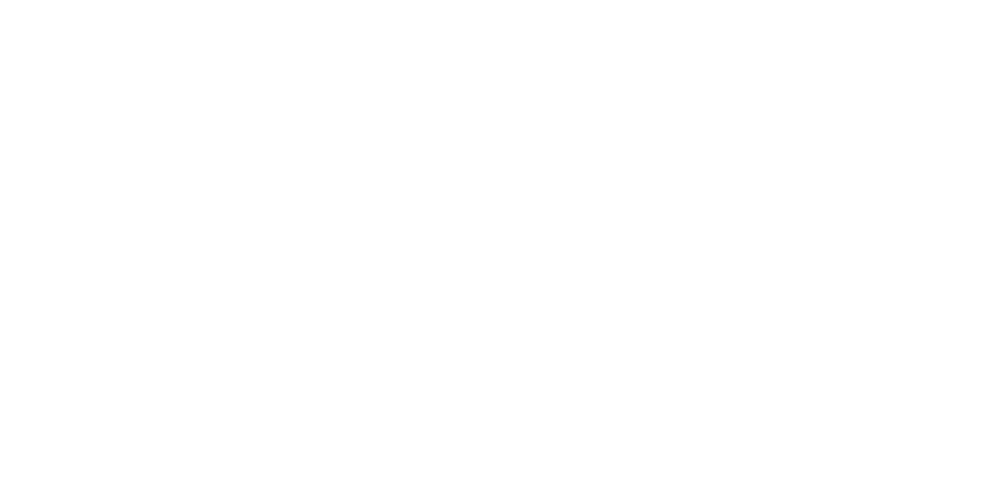

<IPython.core.display.Javascript object>


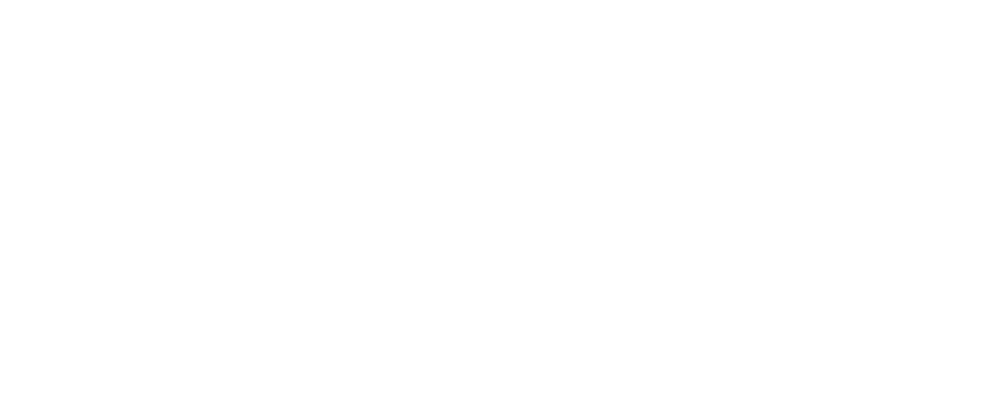

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


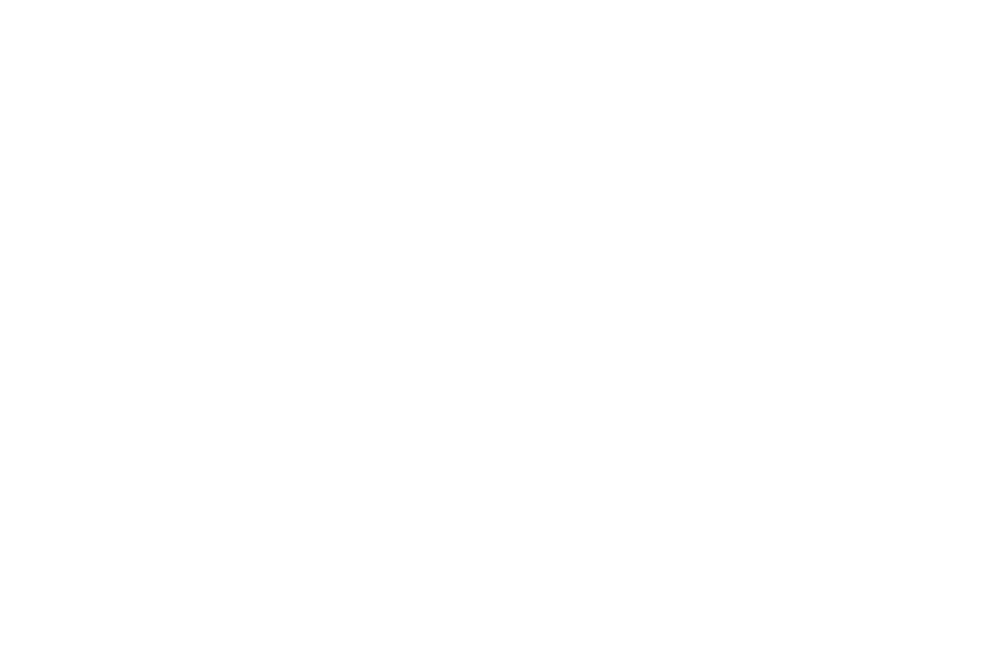

<IPython.core.display.Javascript object>


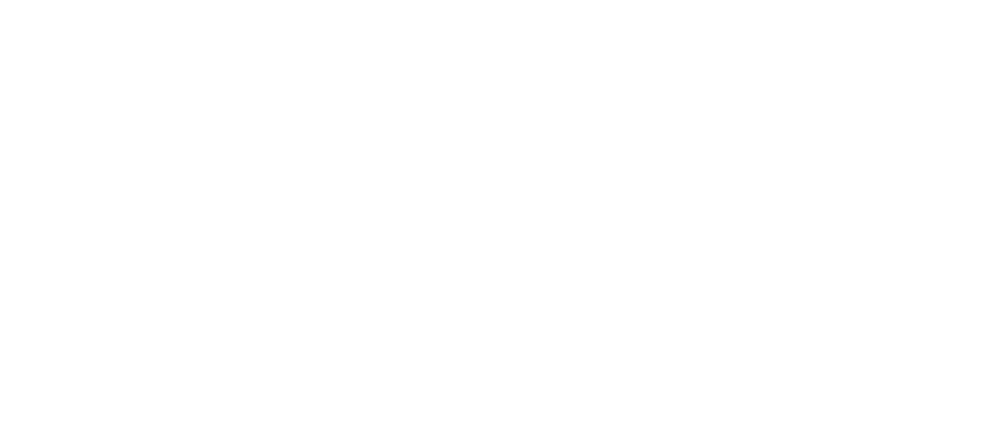

<IPython.core.display.Javascript object>


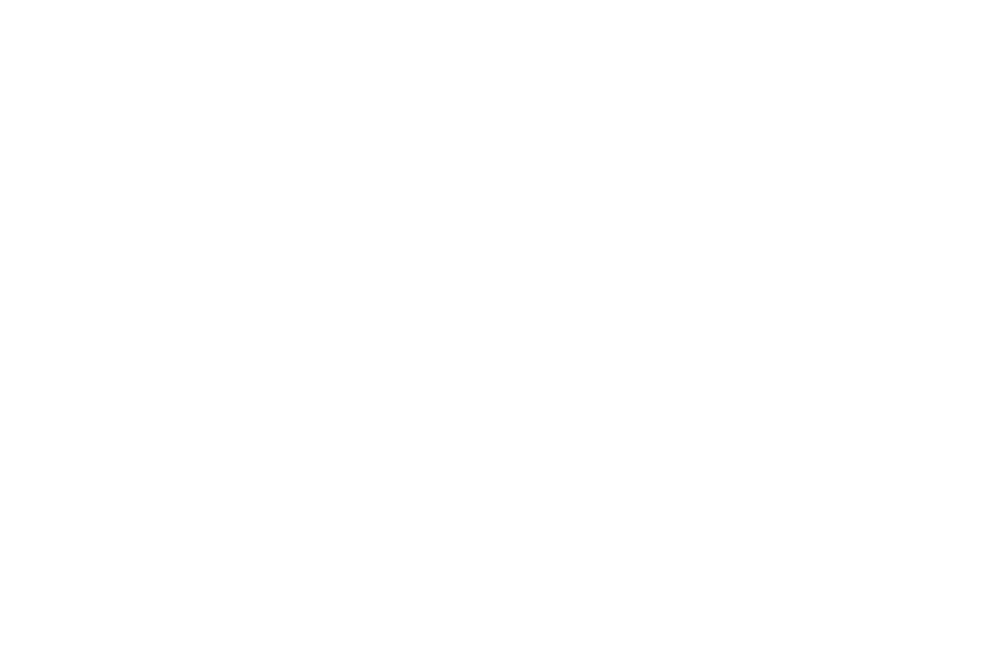

<IPython.core.display.Javascript object>


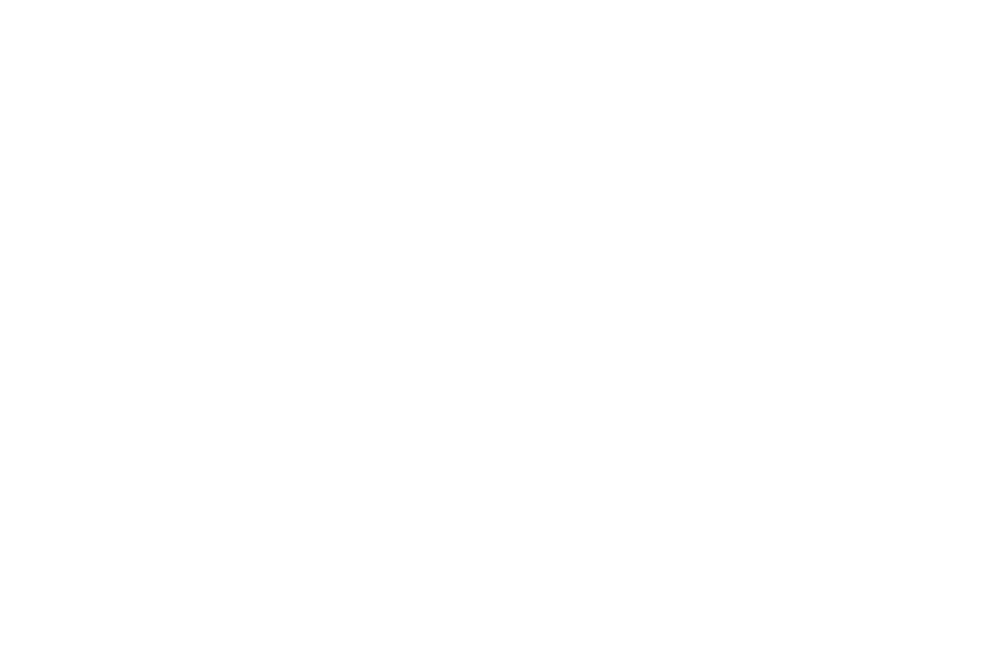

<IPython.core.display.Javascript object>


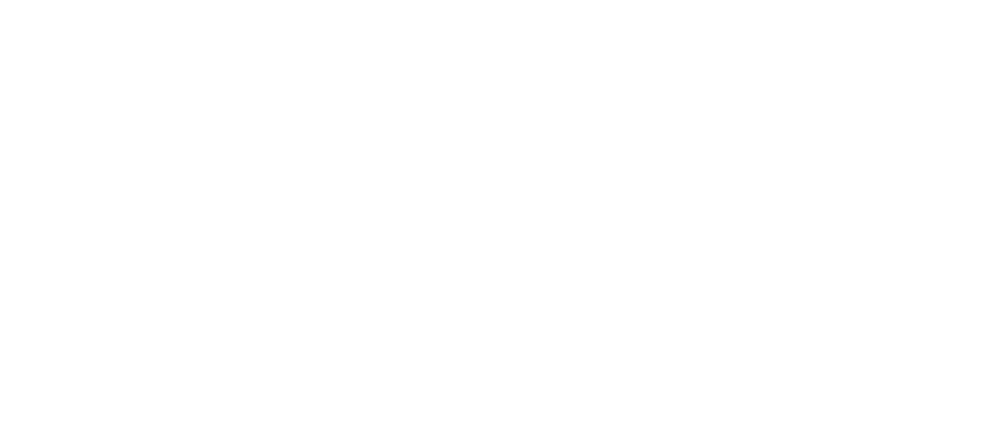

<IPython.core.display.Javascript object>


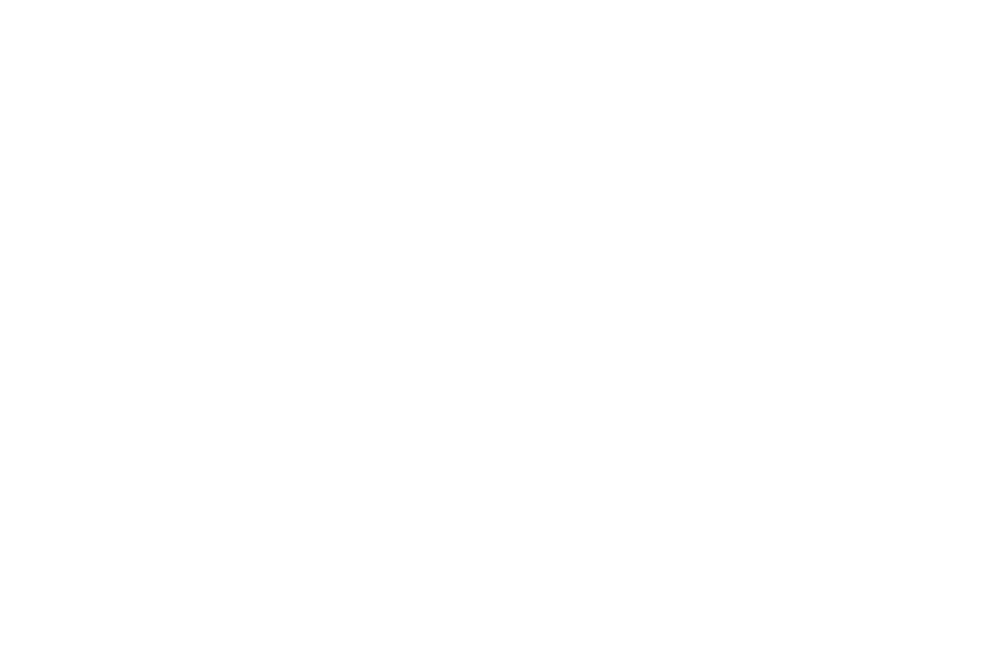

<IPython.core.display.Javascript object>


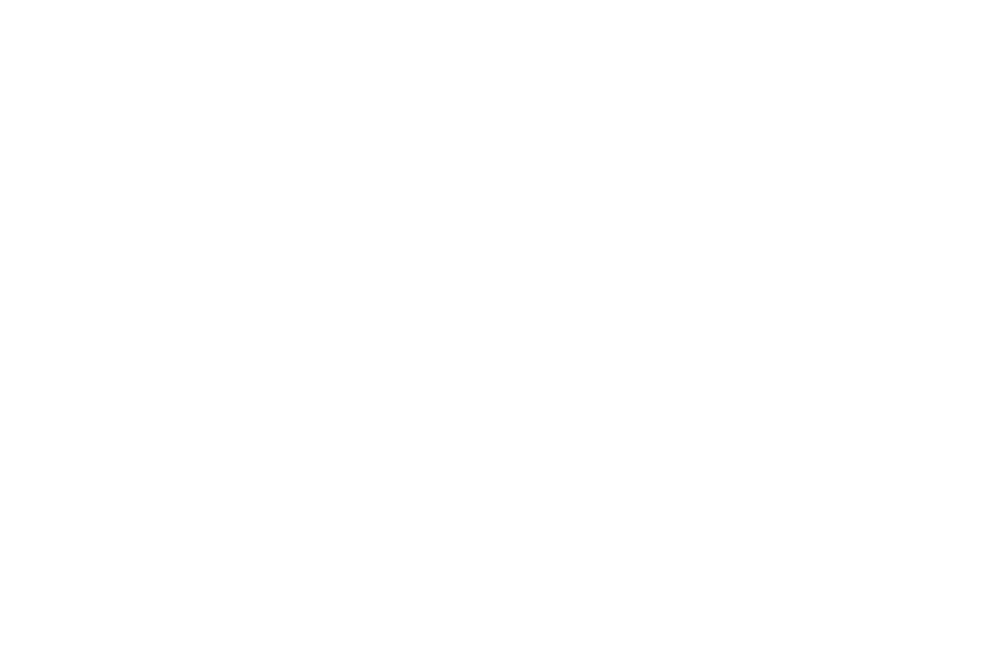

<IPython.core.display.Javascript object>


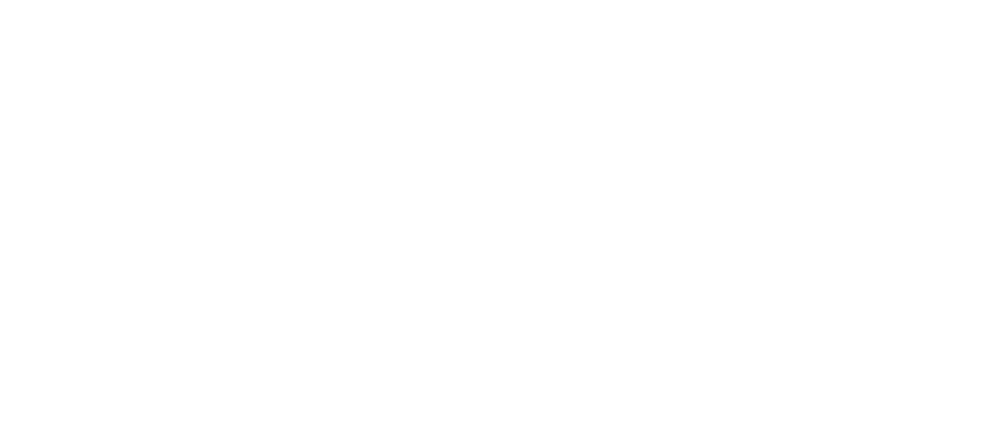

<IPython.core.display.Javascript object>


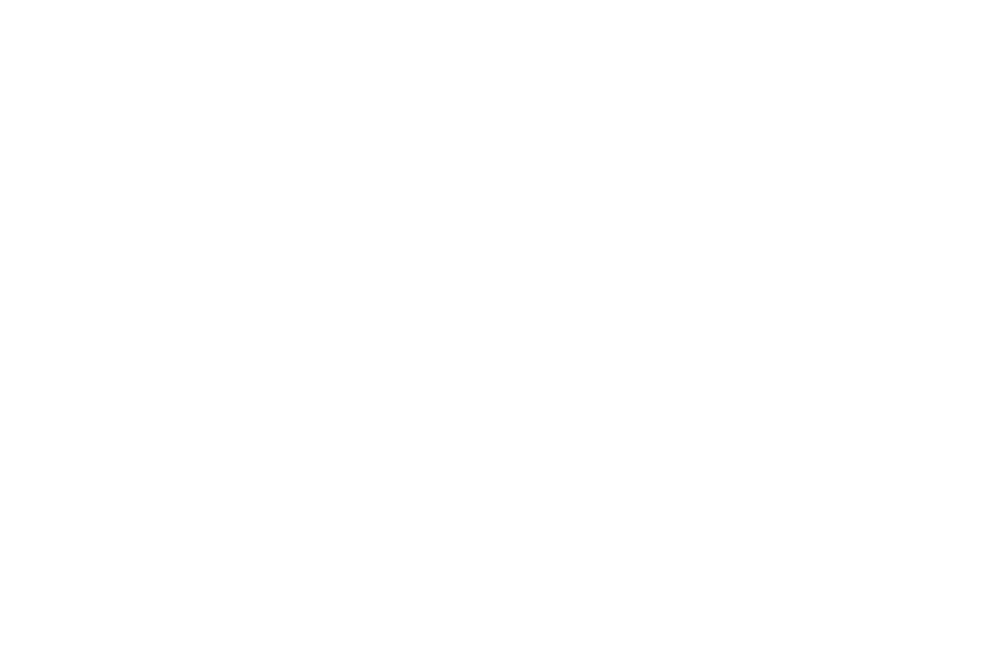

<IPython.core.display.Javascript object>


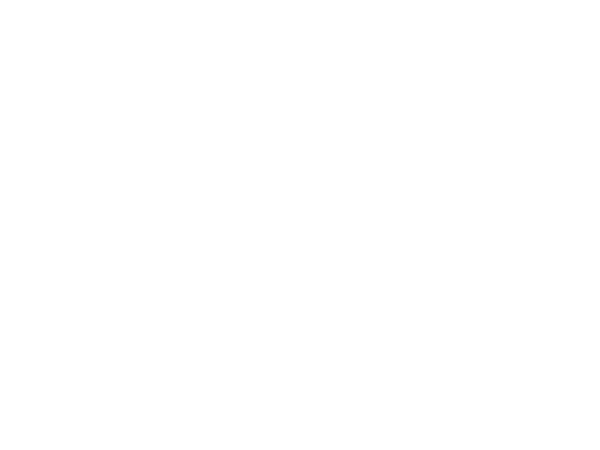

<IPython.core.display.Javascript object>


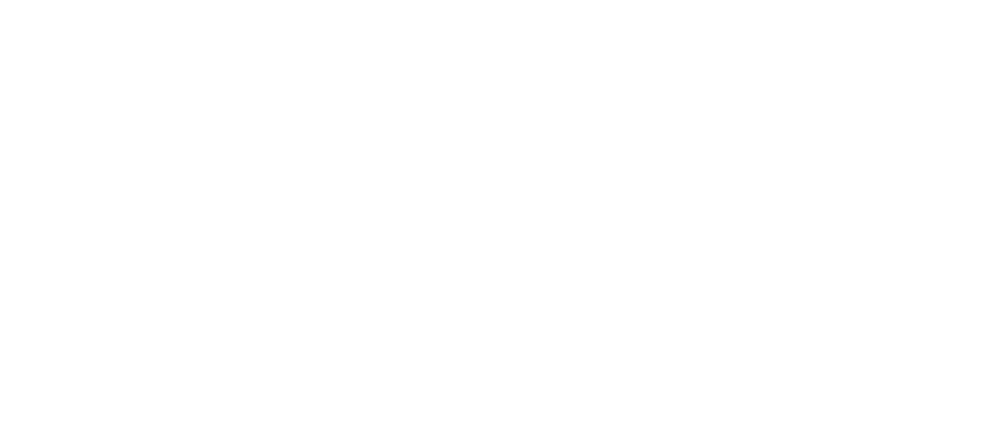

<IPython.core.display.Javascript object>


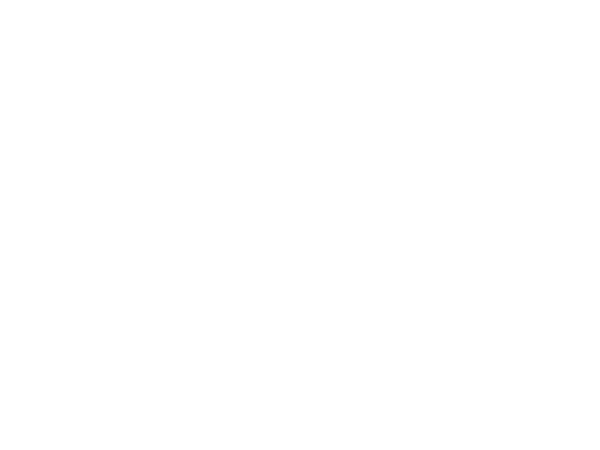

<IPython.core.display.Javascript object>


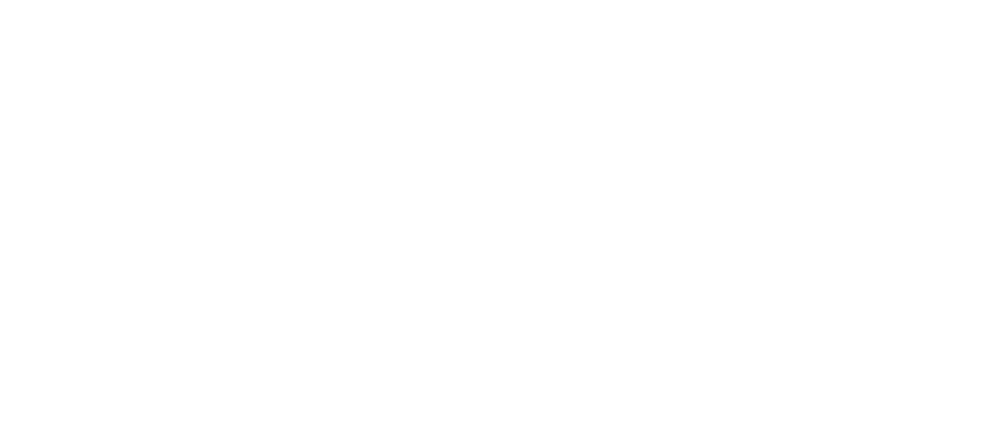

<IPython.core.display.Javascript object>


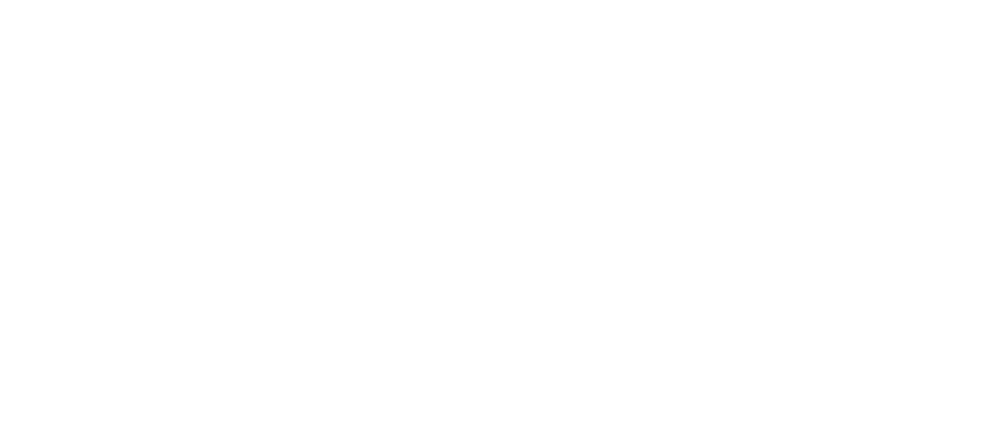

<IPython.core.display.Javascript object>


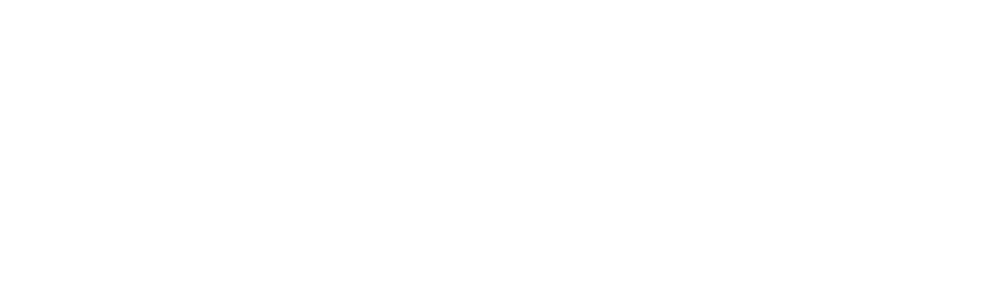

<IPython.core.display.Javascript object>


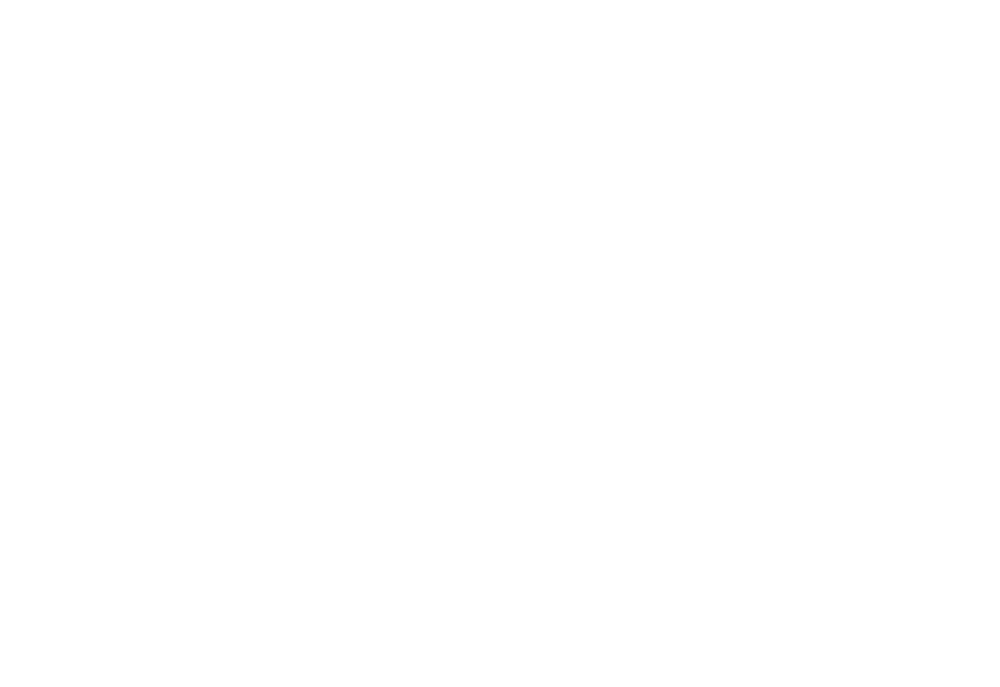

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
profile_chargebacks

### Clean up date columns if necessary and load data into duckdb

In [11]:
# Convert date columns only if necessary
if transactions['transaction_date'].dtype != 'datetime64[ns]':
    transactions['transaction_date'] = pd.to_datetime(transactions['transaction_date'])

if chargebacks['chargeback_date'].dtype != 'datetime64[ns]':
    chargebacks['chargeback_date'] = pd.to_datetime(chargebacks['chargeback_date'])

# Create an in-memory DuckDB database
con = duckdb.connect(database=':memory:')

# Load data into DuckDB
con.register('transactions', transactions)
con.register('merchants', merchants)
con.register('chargebacks', chargebacks)


## Data Analytics and Answering some Business Questions

<IPython.core.display.Javascript object>


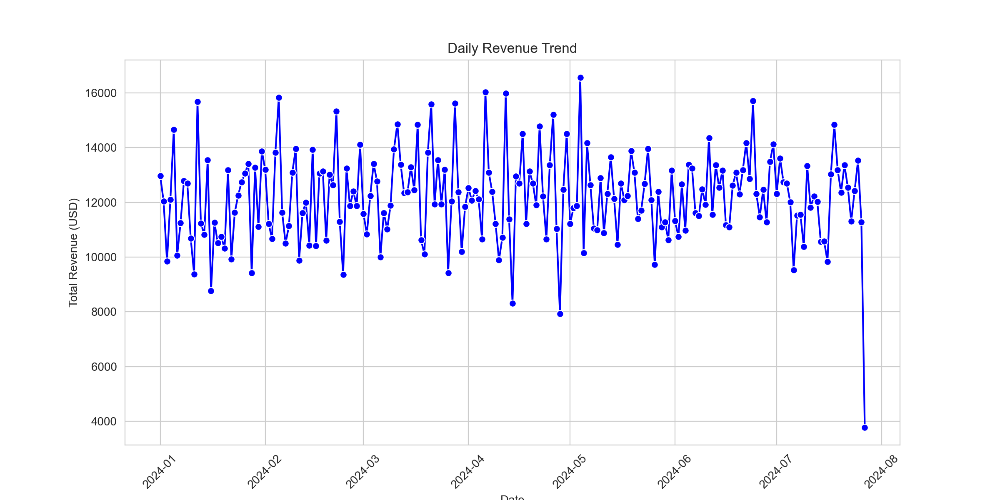

<IPython.core.display.Javascript object>


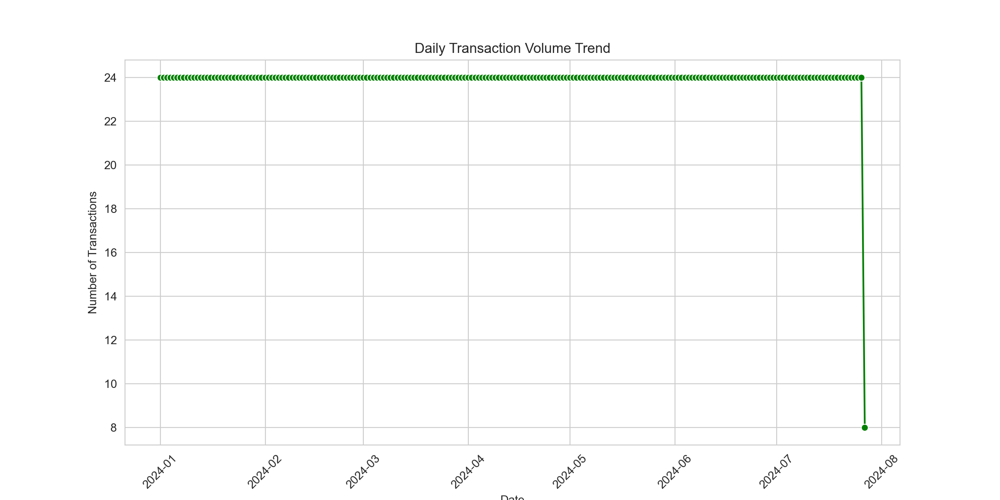

In [12]:

# Query revenue and transaction trends using DuckDB with correct DATE handling
query = '''
SELECT 
    DATE_TRUNC('day', transaction_date) AS transaction_day, 
    COUNT(transaction_id) AS transaction_count, 
    SUM(transaction_amount) AS total_revenue
FROM transactions
GROUP BY transaction_day
ORDER BY transaction_day
'''
daily_trends = con.execute(query).fetchdf()

# Plot revenue trend
plt.figure(figsize=(12, 6))
sns.lineplot(x=daily_trends['transaction_day'], y=daily_trends['total_revenue'], marker='o', color='blue')
plt.title("Daily Revenue Trend")
plt.xlabel("Date")
plt.ylabel("Total Revenue (USD)")
plt.xticks(rotation=45)
plt.show()

# Plot transaction volume trend
plt.figure(figsize=(12, 6))
sns.lineplot(x=daily_trends['transaction_day'], y=daily_trends['transaction_count'], marker='o', color='green')
plt.title("Daily Transaction Volume Trend")
plt.xlabel("Date")
plt.ylabel("Number of Transactions")
plt.xticks(rotation=45)
plt.show()


<IPython.core.display.Javascript object>


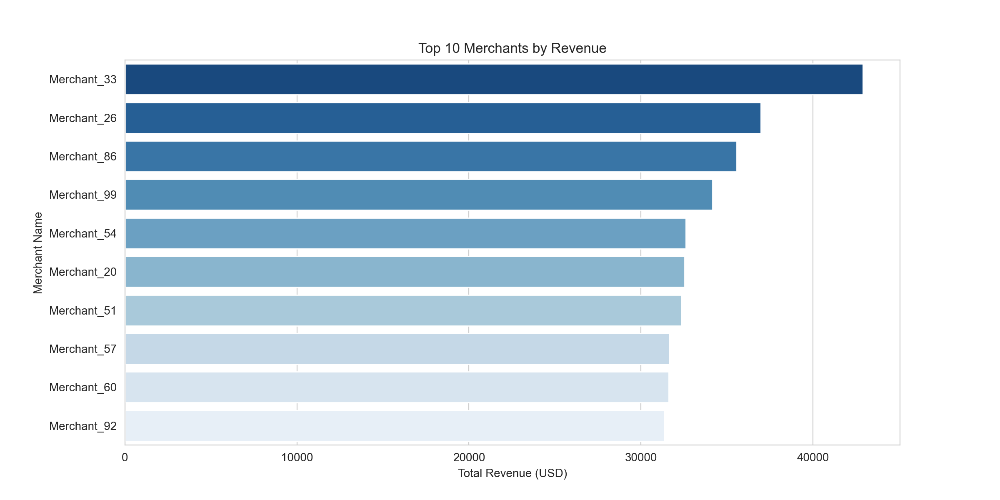

In [13]:

# Query top merchants by revenue
query = '''
SELECT 
    t.merchant_id, 
    m.merchant_name, 
    SUM(t.transaction_amount) AS total_revenue
FROM transactions t
JOIN merchants m ON t.merchant_id = m.merchant_id
GROUP BY t.merchant_id, m.merchant_name
ORDER BY total_revenue DESC
LIMIT 10
'''
top_merchants_df = con.execute(query).fetchdf()

# Plot top merchants
plt.figure(figsize=(12, 6))
sns.barplot(x=top_merchants_df["total_revenue"], y=top_merchants_df["merchant_name"], palette="Blues_r")
plt.title("Top 10 Merchants by Revenue")
plt.xlabel("Total Revenue (USD)")
plt.ylabel("Merchant Name")
plt.show()


<IPython.core.display.Javascript object>


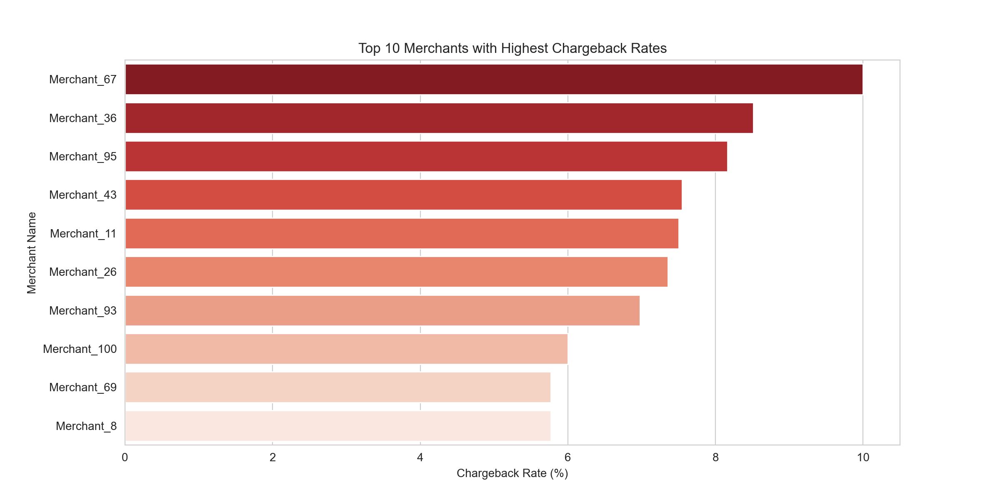

In [14]:

# Query to detect fraudulent activities based on chargebacks
query = '''
SELECT 
    t.merchant_id, 
    m.merchant_name,
    COUNT(c.chargeback_id) AS chargeback_count,
    SUM(c.chargeback_amount) AS total_chargeback_amount,
    COUNT(c.chargeback_id) * 100.0 / COUNT(t.transaction_id) AS chargeback_rate
FROM transactions t
LEFT JOIN chargebacks c ON t.transaction_id = c.transaction_id
LEFT JOIN merchants m ON t.merchant_id = m.merchant_id
GROUP BY t.merchant_id, m.merchant_name
HAVING chargeback_count > 0
ORDER BY chargeback_rate DESC
LIMIT 10
'''
fraudulent_merchants = con.execute(query).fetchdf()

# Visualizing fraud risk by merchants
plt.figure(figsize=(12, 6))
sns.barplot(x=fraudulent_merchants["chargeback_rate"], y=fraudulent_merchants["merchant_name"], palette="Reds_r")
plt.title("Top 10 Merchants with Highest Chargeback Rates")
plt.xlabel("Chargeback Rate (%)")
plt.ylabel("Merchant Name")
plt.show()


In [15]:

# Query to compute total revenue lost due to failed transactions
query = '''
SELECT 
    SUM(transaction_amount) AS failed_revenue_loss,
    COUNT(transaction_id) AS failed_transaction_count
FROM transactions
WHERE status = 'failed'
'''
failed_impact = con.execute(query).fetchdf()

# Display impact of failed transactions
failed_revenue_loss = failed_impact.iloc[0, 0]
failed_transaction_count = failed_impact.iloc[0, 1]

print(f"Total Revenue Lost Due to Failed Transactions: {failed_revenue_loss:,.2f}")
print(f"Total Number of Failed Transactions: {failed_transaction_count}")


Total Revenue Lost Due to Failed Transactions: $271,017.18
Total Number of Failed Transactions: 523


## **Business Recommendations**
### **1. Reduce Fraud & Chargebacks**
- Flag merchants with high chargeback rates for review.
- Enforce two-factor authentication for high-value transactions.
- Implement stricter fraud detection algorithms.

### **2. Improve Transaction Success Rates**
- Identify merchants with high failure rates and investigate issues.
- Optimize payment gateway configurations to reduce failures.
- Offer alternative payment methods for better transaction success.

### **3. Maximize Revenue Recovery**
- Alert customers on failed transactions & suggest retry options.
- Provide incentives for customers who retry failed transactions.
- Improve UI/UX for smoother payment processing.

### **4. Expand Profitable Segments**
- Focus on high-revenue merchants and encourage repeat business.
- Offer targeted promotions for industries with high transaction success rates.